# <h1 style="color:#AED6F1 ; font-weight: bold; font-style: italic;">Load In a Binaural Recording</h1>

Set up where the data is located. In this case, we'll use the sample recordings located under the `Field Rec` folder.

In [21]:
from pathlib import Path
wav_folder = Path().cwd().joinpath("Field Rec")

Ensuring that Soundscapy knows exactly how loud your recordings were onsite is crucial to getting correct answers. If you used equipment such as the Head Acoustics SqoBold, and were careful about how the recordings are exported to .wav, then they may already be correctly adjusted (as ours are here). However its best to be safe and calibrate each signal to their real-world dB level. To do this, we load in a .json that contains the per-channel correct dB $L_{eq}$ level.

In [22]:
import json

levels = wav_folder.joinpath("Levels.json")

with open("Field Rec/Levels.json") as f:
    levels= json.load(f)

list(levels.items())

[('1m', {'Left': 62.573, 'Right': 62.573}),
 ('2m', {'Left': 58.27, 'Right': 58.27}),
 ('3m', {'Left': 55.83, 'Right': 55.83}),
 ('5m', {'Left': 53.93, 'Right': 53.93}),
 ('10m', {'Left': 50.43, 'Right': 50.43}),
 ('15m', {'Left': 50.13, 'Right': 50.13})]

Load in a binaural wav signal. We can use the `plot` function provided by the `acoustics.Signal` super-class.

In [23]:
from soundscapy import Binaural

# Loading (you can load any wave under the Field Rec folder. We Chose "10m.wav")
binaural_wav = wav_folder.joinpath("10m.wav")
b = Binaural.from_wav(binaural_wav)

# Calibration
decibel = (levels[b.recording]["Left"], levels[b.recording]["Left"])

b = Binaural.from_wav(binaural_wav, calibrate_to=decibel)

c:\Users\8x9-45a\AppData\Local\Programs\Python\Python311\Lib\site-packages\acoustics\_signal.py:1048: WavFileWarning: Chunk (non-data) not understood, skipping it.
  fs, data = wavfile.read(filename)


# <h1 style="color:#AED6F1 ; font-weight: bold; font-style: italic;">Calculate Acoustic & Psychoacoustic Matrics</h1>

<h2 style="color:orange ; font-weight: bold; font-style: italic;">For One Wave</h2>

In [24]:
from soundscapy import AnalysisSettings
from soundscapy.analysis.binaural import prep_multiindex_df, process_all_metrics

df = prep_multiindex_df(levels, incl_metric=True)

ex_settings = AnalysisSettings.from_yaml(Path("ex_settings.yaml"))

b.process_all_metrics(ex_settings, verbose=True)

Processing 10m
 - Calculating Python Acoustics metrics: LAeq
 - Calculating MoSQITo metrics: `sharpness_din` from `loudness_zwtv`
 - Calculating MoSQITo metric: roughness_dw


LAeq       N_5     N_avg       S_5     S_avg  \
Recording Channel                                                      
10m       Left     48.947358  7.136661  5.590374  1.857173  1.587287   
          Right    45.529581  6.023488  4.577172  1.726624  1.493431   

                        R_5     R_avg  
Recording Channel                      
10m       Left     0.066442  0.035286  
          Right    0.063485  0.030562

<h2 style="color:orange ; font-weight: bold; font-style: italic;">For All Waves</h2>

In [25]:
import json
from pathlib import Path
from soundscapy import AnalysisSettings
from soundscapy.analysis.binaural import prep_multiindex_df
from soundscapy.analysis.parallel_processing import parallel_process

# Redefine path etc. just for the example
wav_folder = Path().cwd().joinpath("Field Rec")
levels = wav_folder.joinpath("Levels.json")

with open(levels) as f:
    levels = json.load(f)

df = prep_multiindex_df(levels, incl_metric=False)
ex_settings = AnalysisSettings.from_yaml(Path("ex_settings.yaml"))

df = parallel_process(
    wav_folder.glob("*.wav"), df, levels, ex_settings, verbose=True
)

df

Processing files:   0%|          | 0/6 [00:00<?, ?it/s]

LAeq        N_5      N_avg       S_5     S_avg  \
Recording Channel                                                        
1m        Left     62.466480  16.375853  12.207606  1.941610  1.692523   
          Right    61.486554  16.239375  12.280902  1.965279  1.711750   
2m        Left     58.142880  12.041825  10.222816  1.984317  1.744587   
          Right    56.699480  11.780157   9.987620  1.957390  1.709295   
3m        Left     55.482109  10.348564   8.458704  2.003525  1.739835   
          Right    53.034386   9.742258   7.814338  1.937638  1.687280   
5m        Left     53.222831   9.224344   7.358445  2.101190  1.758980   
          Right    50.300400   8.228301   6.521064  2.043312  1.711843   
10m       Left     48.947358   7.136661   5.590374  1.857173  1.587287   
          Right    45.529581   6.023488   4.577172  1.726624  1.493431   
15m       Left     45.188408   5.479919   4.441168  1.682389  1.458282   
          Right    42.258942   4.609429   3.656647  1.650572  1.390105   

                        R_5     R_avg  
Recording Channel                      
1m        Left     0.102000  0.052048  
          Right    0.100981  0.052555  
2m        Left     0.081072  0.049520  
          Right    0.076127  0.044847  
3m        Left     0.087626  0.049725  
          Right    0.080642  0.041296  
5m        Left     0.117709  0.060846  
          Right    0.068250  0.039595  
10m       Left     0.066442  0.035286  
          Right    0.063485  0.030562  
15m       Left     0.051413  0.029973  
          Right    0.051972  0.026553

<h2 style="color:orange ; font-weight: bold; font-style: italic;">Save the File as an Excel File</h2>

In [26]:
from pathlib import Path
from datetime import datetime
Excel_Docs_Folder = Path().cwd().joinpath("Excel Docs")
df.to_excel(Excel_Docs_Folder.joinpath("", f"Acoustic & Psychoacoustic Analysis Results_{datetime.today().strftime('%Y-%m-%d')}.xlsx"))


#df.to_excel("Acoustic & Psychoacoustic Analysis Results.xlsx")

# <h1 style="color:#AED6F1 ; font-weight: bold; font-style: italic;">Plot Binaural Graph</h1>

<Axes: title={'center': 'Binaural - 10m.wav'}, xlabel='$t$ in s', ylabel='$x$ in -'>

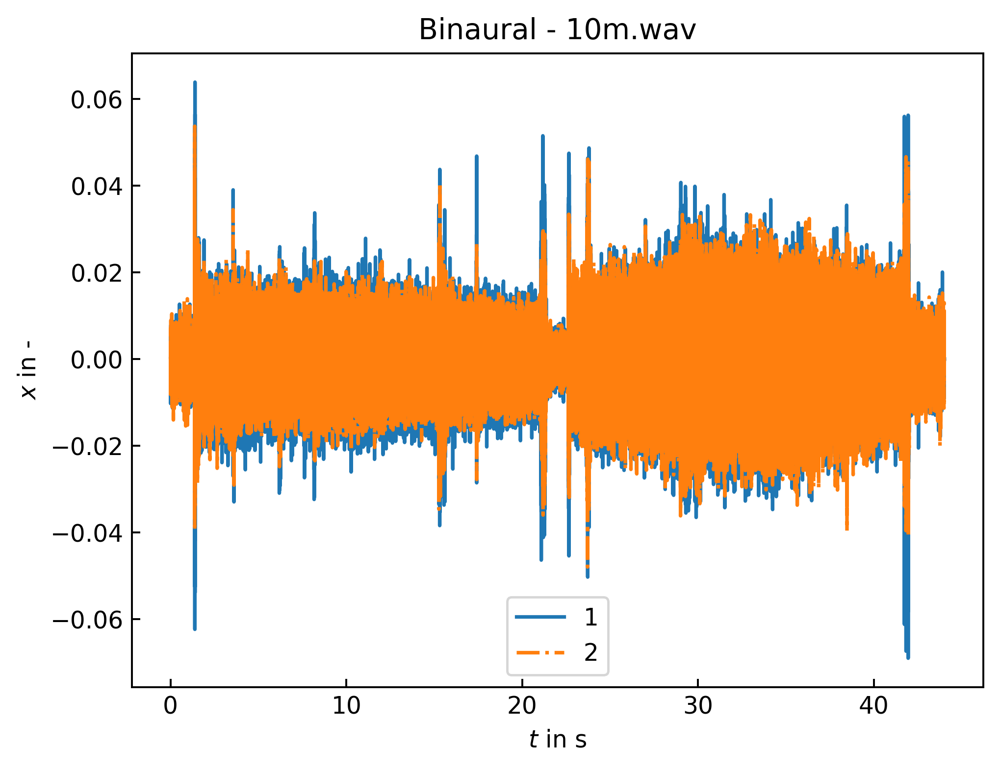

In [27]:
# Plotting
b.plot(title='Binaural - ' + binaural_wav.name)

# <h1 style="color:#AED6F1 ; font-weight: bold; font-style: italic;">Plot Mel-Frequency Spectrogram</h1>

[Text(0.5, 1.0, 'Mel-frequency spectrogram - 10m.wav')]

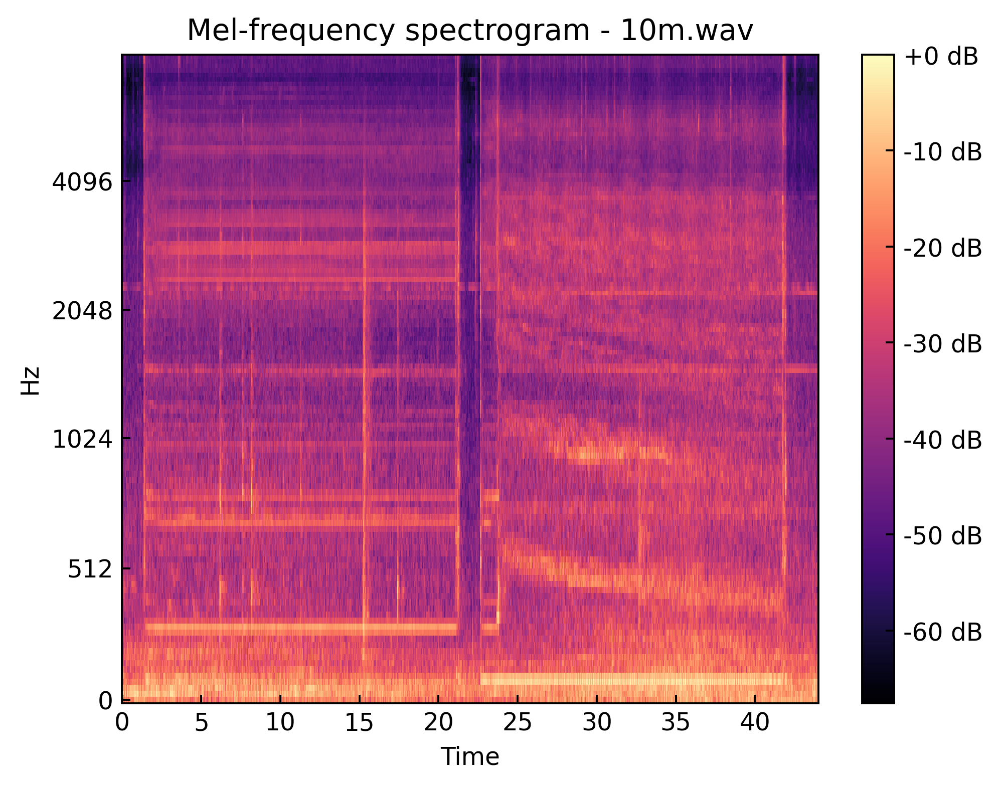

In [28]:
import librosa
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt

wav_folder = Path().cwd().joinpath("Field Rec")

# Loading (you can load any wave under the Field Rec folder. We Chose "10m.wav")
binaural_wav = wav_folder.joinpath("10m.wav")
   
y, sr = librosa.load(binaural_wav)
librosa.feature.melspectrogram(y=y, sr=sr)


D = np.abs(librosa.stft(y))**2
S = librosa.feature.melspectrogram(S=D, sr=sr)

# Passing through arguments to the Mel filters
S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128, fmax=8000)


import matplotlib.pyplot as plt
fig, ax = plt.subplots()
S_dB = librosa.power_to_db(S, ref=np.max)
img = librosa.display.specshow(S_dB, x_axis='time', y_axis='mel', sr=sr, fmax=8000, ax=ax)

fig.colorbar(img, ax=ax, format='%+2.0f dB')
ax.set(title='Mel-frequency spectrogram - ' + binaural_wav.name)

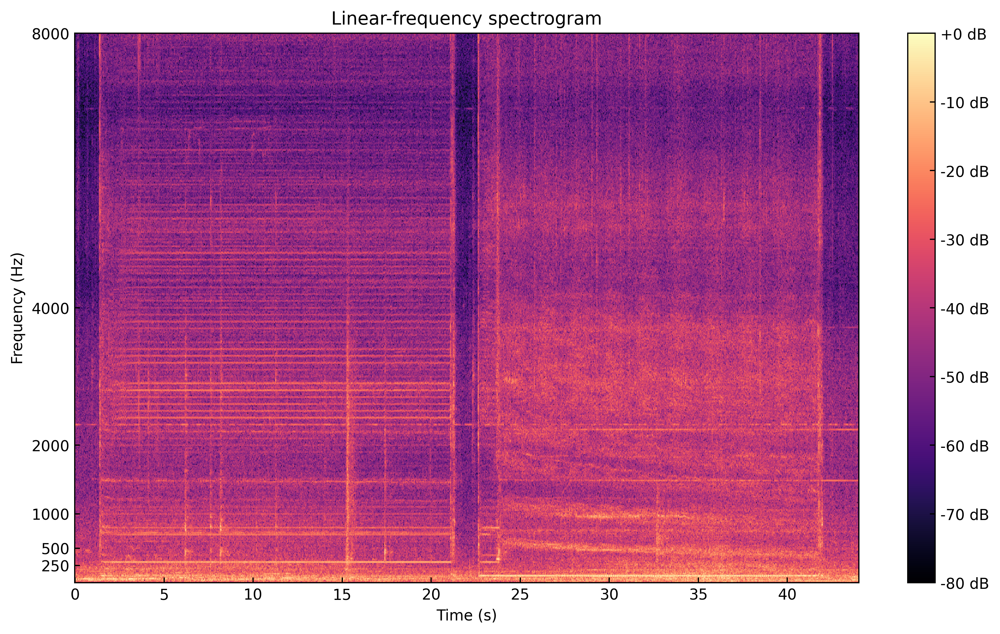

In [29]:
import librosa
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt


wav_folder = Path().cwd().joinpath("Field Rec")

# Loading (you can load any wave under the Field Rec folder. We Chose "10m.wav")
binaural_wav = wav_folder.joinpath("10m.wav")
   
y, sr = librosa.load(binaural_wav)

# Compute spectrogram
D = np.abs(librosa.stft(y))
spectrogram = librosa.amplitude_to_db(D, ref=np.max)

# Display spectrogram
plt.figure(figsize=(10, 6))
librosa.display.specshow(spectrogram, sr=sr, x_axis='time', y_axis='linear')
plt.colorbar(format='%+2.0f dB')
plt.title('Linear-frequency spectrogram')
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.ylim(0,8000)
plt.yticks([250,500,1000,2000,4000,8000])
plt.tight_layout()
plt.show()


# <h1 style="color:#AED6F1 ; font-weight: bold; font-style: italic;">Plot Magnitude for Specific Frequencies</h1>

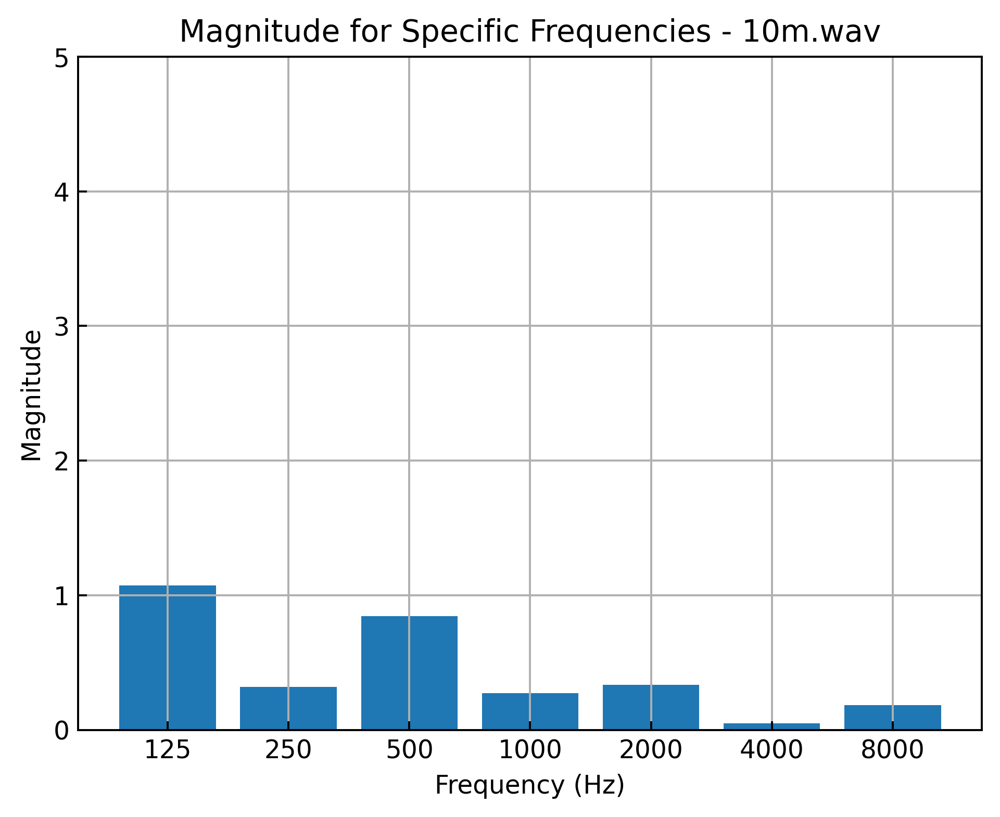

In [30]:
import librosa
import numpy as np
import matplotlib.pyplot as plt


sound_data, sampling_rate = librosa.load(binaural_wav, sr=None)
# Calculate the FFT magnitude
fft_magnitude = np.abs(np.fft.fft(sound_data))

# Frequencies of interest
frequencies = [125, 250, 500, 1000, 2000, 4000, 8000]

# Find the indices corresponding to the frequencies of interest
indices = []
for freq in frequencies:
    index = int(freq * len(fft_magnitude) / sampling_rate)
    indices.append(index)

# Extract the magnitudes for the frequencies of interest
magnitudes = fft_magnitude[indices]

# Plot a bar chart of the magnitudes
plt.bar(np.arange(len(frequencies)), magnitudes)
plt.xticks(np.arange(len(frequencies)), frequencies)
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.ylim(0, 5)
plt.title('Magnitude for Specific Frequencies - ' + binaural_wav.name)
plt.grid(True)
plt.show()


# <h1 style="color:#AED6F1 ; font-weight: bold; font-style: italic;">SLM Comparison</h1>

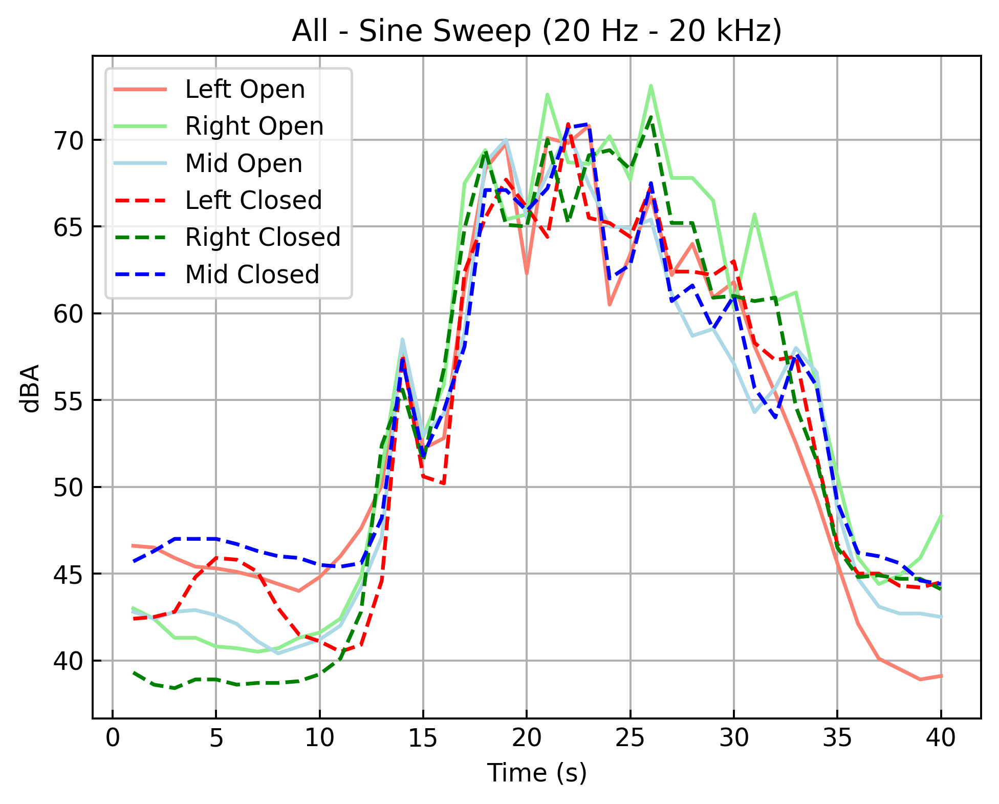

In [31]:
# Open & Closed

import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

# You can directly put the path of the file that you want to read data from: data = pd.read_excel(/PATH)
# data = pd.read_excel('C:/Users/fspintern1/Desktop/Internship - Hussam/Intern/Digital Workflow/Excel Docs/SLM Comparison.xlsx')
# or

Excel_Docs_Folder = Path().cwd().joinpath("Excel Docs")
data = pd.read_excel(Excel_Docs_Folder.joinpath("", "SLM Comparison.xlsx"))

# Plot the first graph
plt.plot(data['Time'], data['Left Open'], label='Left Open', color='salmon')

# Plot the second graph
plt.plot(data['Time'], data['Right Open'], label='Right Open', color='lightgreen')

# Plot the third graph
plt.plot(data['Time'], data['Mid Open'], label='Mid Open', color='lightblue')

# Plot the forth graph
plt.plot(data['Time'], data['Left Closed'], label='Left Closed', color='red', linestyle='--')

# Plot the fifth graph
plt.plot(data['Time'], data['Right Closed'], label='Right Closed', color='green', linestyle='--')

# Plot the sixth graph
plt.plot(data['Time'], data['Mid Closed'], label='Mid Closed', color='blue', linestyle='--')

# Add labels, title, and grid
plt.xlabel('Time (s)')
plt.ylabel('dBA')
plt.title('All - Sine Sweep (20 Hz - 20 kHz)')
plt.grid()

# Add legend to distinguish between the two graphs
#plt.legend()
plt.legend(loc='upper left')  # or loc='upper left'




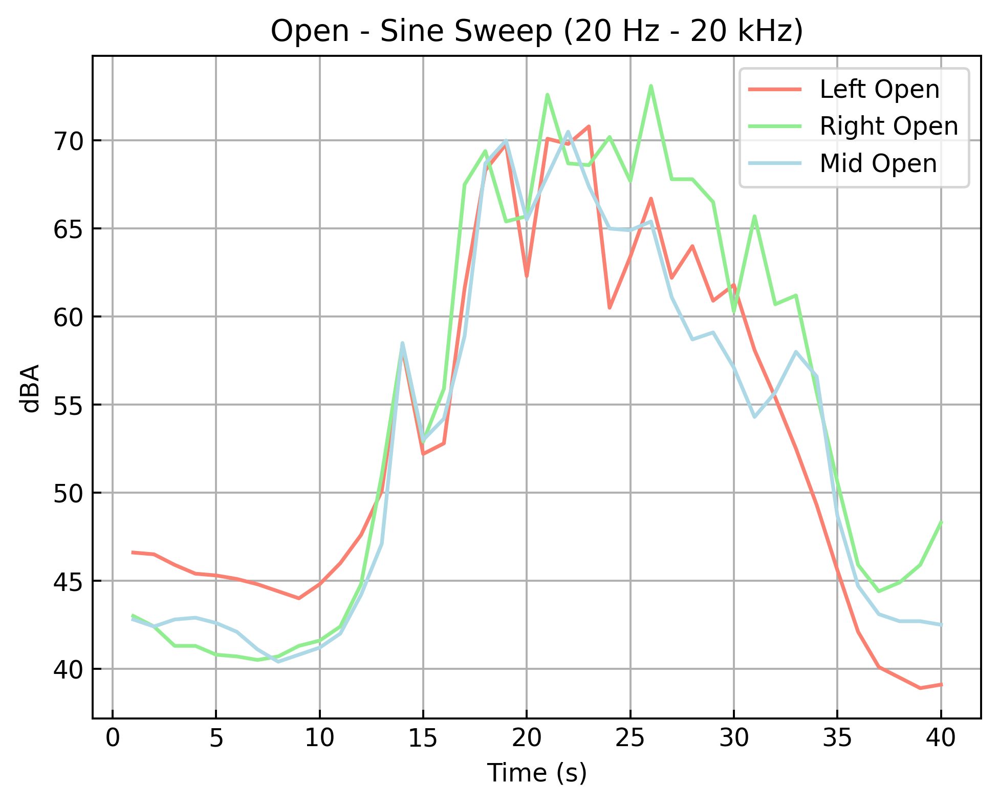

In [32]:
# Open

import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

# You can directly put the path of the file that you want to read data from: data = pd.read_excel(/PATH)
# data = pd.read_excel('C:/Users/fspintern1/Desktop/Internship - Hussam/Intern/Digital Workflow/Excel Docs/SLM Comparison.xlsx')
# or

Excel_Docs_Folder = Path().cwd().joinpath("Excel Docs")
data = pd.read_excel(Excel_Docs_Folder.joinpath("", "SLM Comparison.xlsx"))

# Plot the first graph
plt.plot(data['Time'], data['Left Open'], label='Left Open', color='salmon')

# Plot the second graph
plt.plot(data['Time'], data['Right Open'], label='Right Open', color='lightgreen')

# Plot the third graph
plt.plot(data['Time'], data['Mid Open'], label='Mid Open', color='lightblue')

# Add labels, title, and grid
plt.xlabel('Time (s)')
plt.ylabel('dBA')
plt.title('Open - Sine Sweep (20 Hz - 20 kHz)')
plt.grid()

# Add legend to distinguish between the two graphs
plt.legend()

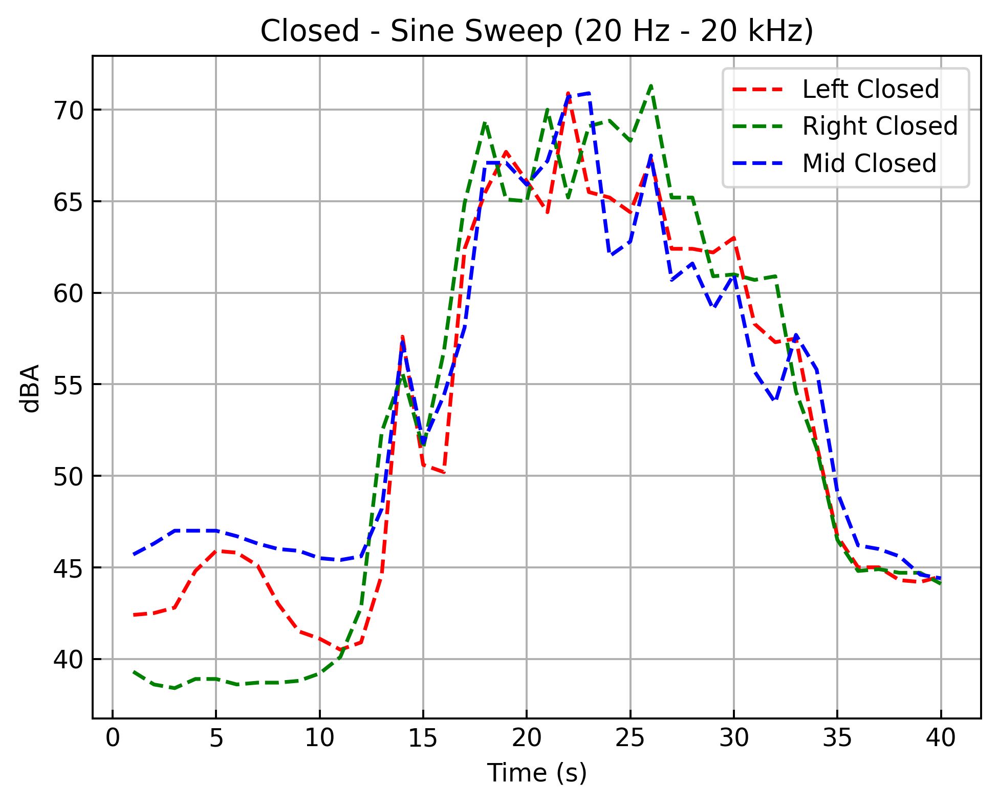

In [33]:
# Closed

import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

# You can directly put the path of the file that you want to read data from: data = pd.read_excel(/PATH)
# data = pd.read_excel('C:/Users/fspintern1/Desktop/Internship - Hussam/Intern/Digital Workflow/Excel Docs/SLM Comparison.xlsx')
# or

Excel_Docs_Folder = Path().cwd().joinpath("Excel Docs")
data = pd.read_excel(Excel_Docs_Folder.joinpath("", "SLM Comparison.xlsx"))

# Plot the first graph
plt.plot(data['Time'], data['Left Closed'], label='Left Closed', color='red', linestyle='--')

# Plot the second graph
plt.plot(data['Time'], data['Right Closed'], label='Right Closed', color='green', linestyle='--')

# Plot the third graph
plt.plot(data['Time'], data['Mid Closed'], label='Mid Closed', color='blue', linestyle='--')

# Add labels, title, and grid
plt.xlabel('Time (s)')
plt.ylabel('dBA')
plt.title('Closed - Sine Sweep (20 Hz - 20 kHz)')
plt.grid()

# Add legend to distinguish between the two graphs
plt.legend()

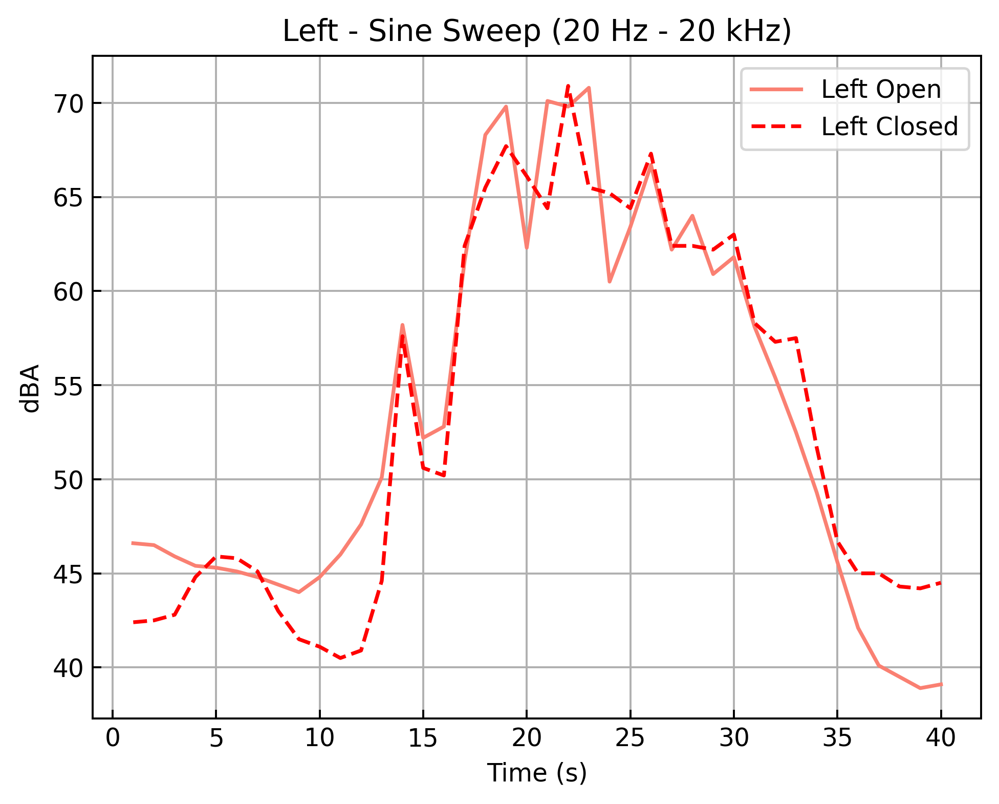

In [34]:
# Left

import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

# You can directly put the path of the file that you want to read data from: data = pd.read_excel(/PATH)
# data = pd.read_excel('C:/Users/fspintern1/Desktop/Internship - Hussam/Intern/Digital Workflow/Excel Docs/SLM Comparison.xlsx')
# or

Excel_Docs_Folder = Path().cwd().joinpath("Excel Docs")
data = pd.read_excel(Excel_Docs_Folder.joinpath("", "SLM Comparison.xlsx"))

# Plot the first graph
plt.plot(data['Time'], data['Left Open'], label='Left Open', color='salmon')

# Plot the second graph
plt.plot(data['Time'], data['Left Closed'], label='Left Closed', color='red', linestyle='--')

# Add labels, title, and grid
plt.xlabel('Time (s)')
plt.ylabel('dBA')
plt.title('Left - Sine Sweep (20 Hz - 20 kHz)')
plt.grid()

# Add legend to distinguish between the two graphs
plt.legend()

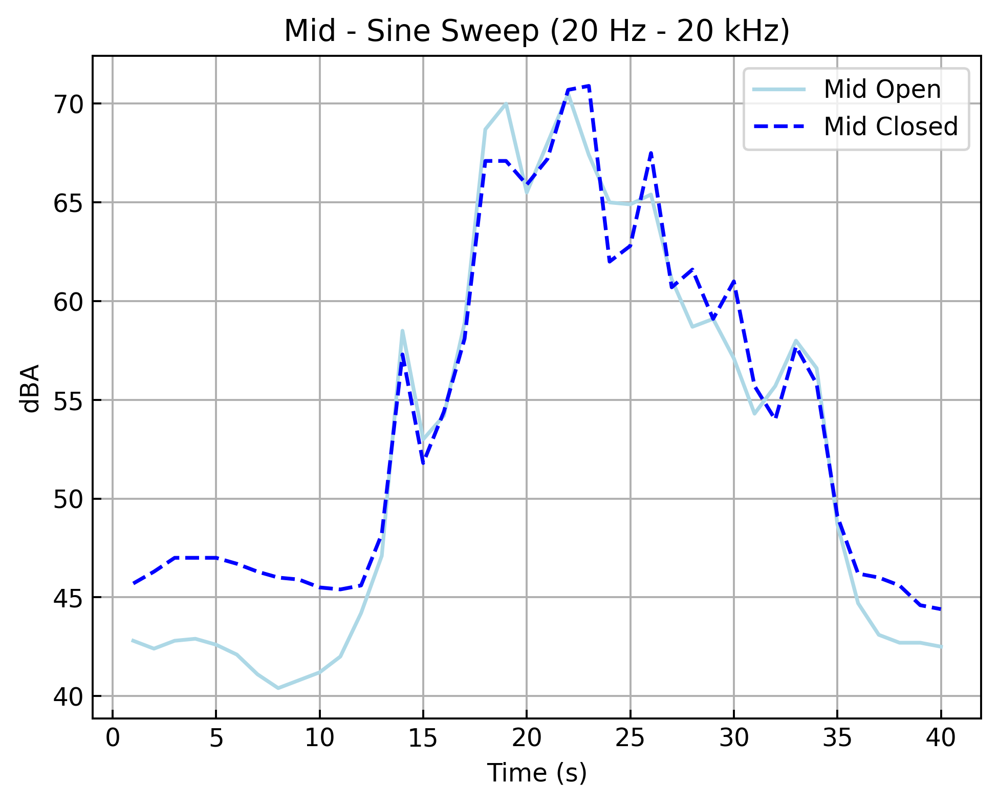

In [35]:
# Mid

import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

# You can directly put the path of the file that you want to read data from: data = pd.read_excel(/PATH)
# data = pd.read_excel('C:/Users/fspintern1/Desktop/Internship - Hussam/Intern/Digital Workflow/Excel Docs/SLM Comparison.xlsx')
# or

Excel_Docs_Folder = Path().cwd().joinpath("Excel Docs")
data = pd.read_excel(Excel_Docs_Folder.joinpath("", "SLM Comparison.xlsx"))

# Plot the first graph
plt.plot(data['Time'], data['Mid Open'], label='Mid Open', color='lightblue')

# Plot the second graph
plt.plot(data['Time'], data['Mid Closed'], label='Mid Closed', color='blue', linestyle='--')

# Add labels, title, and grid
plt.xlabel('Time (s)')
plt.ylabel('dBA')
plt.title('Mid - Sine Sweep (20 Hz - 20 kHz)')
plt.grid()

# Add legend to distinguish between the two graphs
plt.legend()

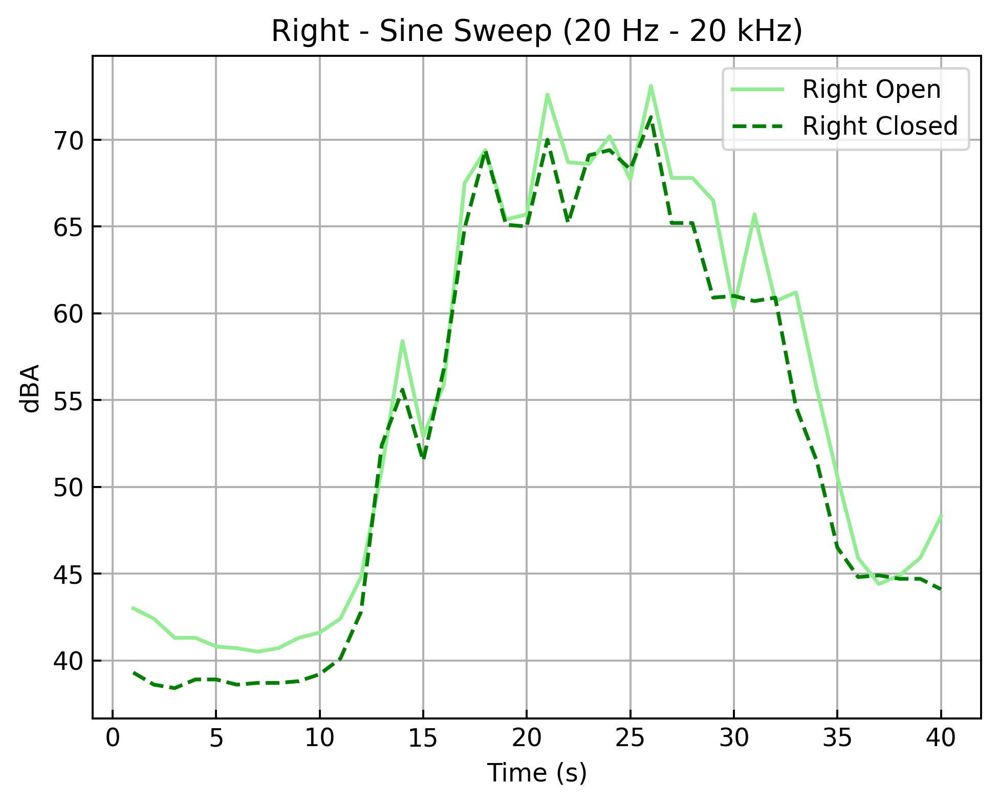

In [36]:
# Right

import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

# You can directly put the path of the file that you want to read data from: data = pd.read_excel(/PATH)
# data = pd.read_excel('C:/Users/fspintern1/Desktop/Internship - Hussam/Intern/Digital Workflow/Excel Docs/SLM Comparison.xlsx')
# or

Excel_Docs_Folder = Path().cwd().joinpath("Excel Docs")
data = pd.read_excel(Excel_Docs_Folder.joinpath("", "SLM Comparison.xlsx"))

# Plot the first graph
plt.plot(data['Time'], data['Right Open'], label='Right Open', color='lightgreen')

# Plot the second graph
plt.plot(data['Time'], data['Right Closed'], label='Right Closed', color='green', linestyle='--')

# Add labels, title, and grid
plt.xlabel('Time (s)')
plt.ylabel('dBA')
plt.title('Right - Sine Sweep (20 Hz - 20 kHz)')
plt.grid()

# Add legend to distinguish between the two graphs
plt.legend()

# <h1 style="color:#AED6F1 ; font-weight: bold; font-style: italic;">Magnitude for Specific Frequencies</h1>

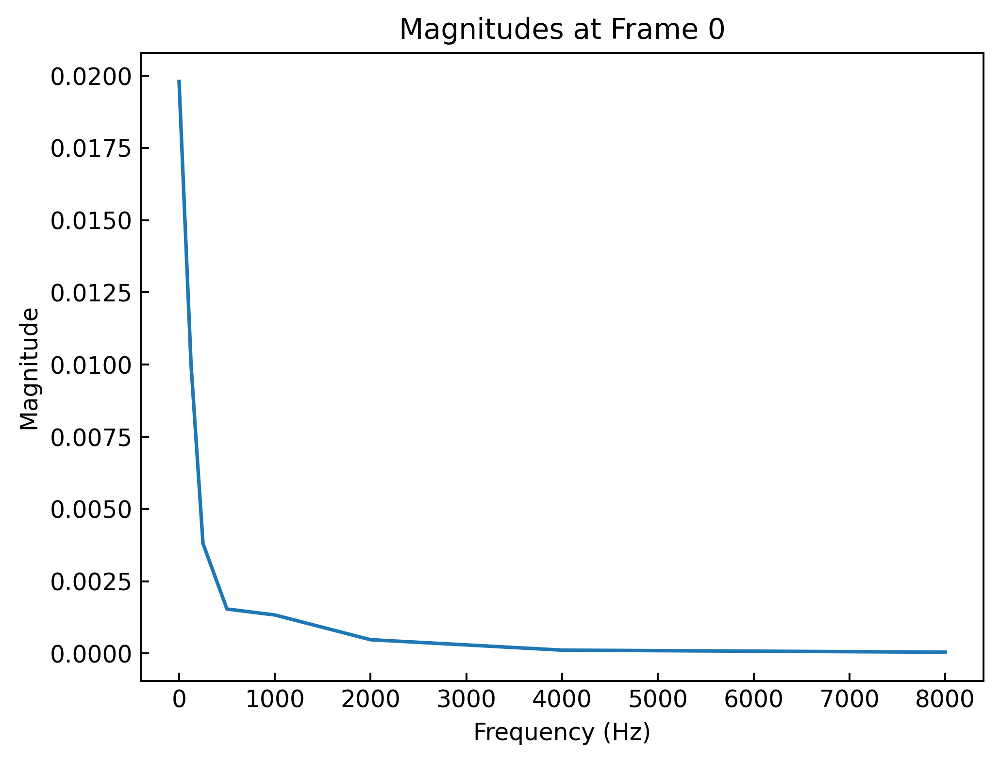

In [37]:
import librosa
import numpy as np
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt

# Function to get frequencies and corresponding magnitudes from STFT data
def get_frequencies_and_magnitudes(stft_data, sr, n_fft):
    frequencies = np.fft.fftfreq(n_fft, d=1.0/sr)[:n_fft//2]  # Get positive frequencies
    magnitudes = np.abs(stft_data)[:n_fft//2]  # Get magnitudes
    return frequencies, magnitudes

wav_folder = Path().cwd().joinpath("Field Rec")

# Loading (you can load any wave under the Field Rec folder. We Chose "10m.wav")
binaural_wav = wav_folder.joinpath("10m.wav")
   
y, sr = librosa.load(binaural_wav)

# Choose the window size for STFT (e.g., 2048)
n_fft = 2048

# Compute STFT
stft_data = librosa.stft(y, n_fft=n_fft)

# Get frequencies and magnitudes
frequencies, magnitudes = get_frequencies_and_magnitudes(stft_data, sr, n_fft)

# Frequencies of interest
frequencies_of_interest = [0, 125, 250, 500, 1000, 2000, 4000, 8000]

# Find indices corresponding to the frequencies of interest
indices_of_interest = [np.abs(frequencies - freq).argmin() for freq in frequencies_of_interest]

# Extract magnitudes for the specified frequencies and all time frames
selected_magnitudes = magnitudes[indices_of_interest, :]

# Create a DataFrame to store the data
data_dict = {
    'Frequency (Hz)': frequencies_of_interest,
}
for i in range(selected_magnitudes.shape[1]):
    data_dict[f'Magnitude (Frame {i})'] = selected_magnitudes[:, i]

df = pd.DataFrame(data_dict)

# Save the DataFrame to an Excel file
#df.to_excel('Frequency Magnitudes.xlsx', index=False)

# Now you can plot the magnitudes at a specific time frame (frame_index):

frame_index = 0
plt.plot(frequencies_of_interest, df[f'Magnitude (Frame {frame_index})'])
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.title(f'Magnitudes at Frame {frame_index}')
plt.show()


In [38]:
df

Frequency (Hz)  Magnitude (Frame 0)  Magnitude (Frame 1)  \
0               0             0.019802             0.022575   
1             125             0.010010             0.005100   
2             250             0.003802             0.008282   
3             500             0.001537             0.004167   
4            1000             0.001331             0.000934   
5            2000             0.000475             0.000990   
6            4000             0.000114             0.000239   
7            8000             0.000043             0.000375   

   Magnitude (Frame 2)  Magnitude (Frame 3)  Magnitude (Frame 4)  \
0             0.010929             0.005272             0.009994   
1             0.011158             0.030248             0.017015   
2             0.006667             0.003683             0.004709   
3             0.007610             0.005331             0.005247   
4             0.001551             0.001924             0.000573   
5             0.001551             0.001044             0.000559   
6             0.000163             0.000616             0.000444   
7             0.000716             0.000549             0.000252   

   Magnitude (Frame 5)  Magnitude (Frame 6)  Magnitude (Frame 7)  \
0             0.011113             0.023584             0.010559   
1             0.013638             0.002183             0.013630   
2             0.006048             0.003629             0.008689   
3             0.000582             0.004980             0.006384   
4             0.000997             0.000689             0.001952   
5             0.000522             0.000709             0.001620   
6             0.000414             0.000394             0.000496   
7             0.000162             0.000091             0.000423   

   Magnitude (Frame 8)  Magnitude (Frame 9)  Magnitude (Frame 10)  \
0             0.003548             0.009967              0.006996   
1             0.014831             0.007980              0.007580   
2             0.011002             0.006955              0.006515   
3             0.003769             0.002941              0.006376   
4             0.001844             0.003135              0.003442   
5             0.000762             0.000265              0.001016   
6             0.000661             0.000423              0.000360   
7             0.000353             0.000216              0.000280   

   Magnitude (Frame 11)  Magnitude (Frame 12)  Magnitude (Frame 13)  \
0              0.005896              0.010453              0.007134   
1              0.012487              0.014011              0.010641   
2              0.002309              0.007847              0.005872   
3              0.005584              0.003388              0.006487   
4              0.002300              0.002759              0.001262   
5              0.001922              0.001070              0.000335   
6              0.000158              0.000439              0.000418   
7              0.000418              0.000371              0.000151   

   Magnitude (Frame 14)  Magnitude (Frame 15)  Magnitude (Frame 16)  \
0              0.002023              0.003666              0.014826   
1              0.002788              0.006628              0.004002   
2              0.008694              0.008564              0.002087   
3              0.007952              0.006726              0.003568   
4              0.000451              0.000734              0.000959   
5              0.001343              0.001895              0.001351   
6              0.000090              0.000107              0.000209   
7              0.000232              0.000324              0.000264   

   Magnitude (Frame 17)  Magnitude (Frame 18)  Magnitude (Frame 19)  \
0              0.012309              0.001249              0.005039   
1              0.010371              0.006854              0.006505   
2              0.005190              0.008935              0.007775   
3              0.000518

# <h1 style="color:#AED6F1 ; font-weight: bold; font-style: italic;">Load In Questionnaire Answers (PAQs)</h1>

In [1]:
import soundscapy
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt

# Set display options
pd.set_option('display.max_columns', None)  # Show all columns
pd.set_option('display.max_rows', None)     # Show all rows
pd.set_option('display.width', None)        # Set width to fit the entire DataFrame

# You can directly put the path of the file that you want to read data from: data = pd.read_excel(/PATH)
# or

Data_Path = Path().cwd().joinpath("Excel Docs")
df1 = pd.read_excel(Data_Path.joinpath("", "PAQs Answer.xlsx"))

df1

,Participint,Age,RecordID,GroupID,SessionID,Gender,LocationID,Date,Time,pleasant,chaotic,vibrant,uneventful,calm,annoying,eventful,monotonous
0,Max,28.0,1,1,1,M,R1c,2023-07-19,09:40:00,5,1,1,5,5,1,1,2
1,Max,28.0,2,1,1,M,R1m,2023-07-19,09:44:00,1,1,1,3,1,4,2,5
2,Max,28.0,3,1,1,M,R1o,2023-07-19,09:46:00,5,1,1,5,5,1,1,3
3,Amanda,33.0,4,1,1,F,R1c,2023-07-19,09:55:00,3,2,1,4,4,1,1,4
4,Amanda,33.0,5,1,1,F,R1m,2023-07-19,09:58:00,1,4,2,1,1,5,4,1
5,Amanda,33.0,6,1,1,F,R1o,2023-07-19,10:00:00,4,1,1,4,4,1,3,4
6,Maraile,25.0,7,1,1,F,R1c,2023-07-19,10:08:00,4,1,3,3,4,1,3,2
7,Maraile,25.0,8,1,1,F,R1m,2023-07-19,10:10:00,2,3,2,3,1,4,3,3
8,Maraile,25.0,9,1,1,F,R1o,2023-07-19,10:12:00,4,1,3,2,4,1,3,2
9,Mina,NaN,10,2,2,F,R1c,2023-07-25,10:54:00,3,3,2,1,4,1,3,2


# <h1 style="color:#AED6F1 ; font-weight: bold; font-style: italic;">Validate the Dataset</h1>

In [2]:
# 'df' will contain the validated DataFrame
# 'excl' will contain any excluded data or information returned by the method

df2, excl = df1.isd.validate_dataset()
df2

Renaming PAQ columns.
Checking PAQ data quality.
PAQ quality confirmed. No rows dropped.


,Participint,Age,RecordID,GroupID,SessionID,Gender,LocationID,Date,Time,PAQ1,PAQ4,PAQ2,PAQ7,PAQ8,PAQ5,PAQ3,PAQ6
0,Max,28.0,1,1,1,M,R1c,2023-07-19,09:40:00,5,1,1,5,5,1,1,2
1,Max,28.0,2,1,1,M,R1m,2023-07-19,09:44:00,1,1,1,3,1,4,2,5
2,Max,28.0,3,1,1,M,R1o,2023-07-19,09:46:00,5,1,1,5,5,1,1,3
3,Amanda,33.0,4,1,1,F,R1c,2023-07-19,09:55:00,3,2,1,4,4,1,1,4
4,Amanda,33.0,5,1,1,F,R1m,2023-07-19,09:58:00,1,4,2,1,1,5,4,1
5,Amanda,33.0,6,1,1,F,R1o,2023-07-19,10:00:00,4,1,1,4,4,1,3,4
6,Maraile,25.0,7,1,1,F,R1c,2023-07-19,10:08:00,4,1,3,3,4,1,3,2
7,Maraile,25.0,8,1,1,F,R1m,2023-07-19,10:10:00,2,3,2,3,1,4,3,3
8,Maraile,25.0,9,1,1,F,R1o,2023-07-19,10:12:00,4,1,3,2,4,1,3,2
9,Mina,NaN,10,2,2,F,R1c,2023-07-25,10:54:00,3,3,2,1,4,1,3,2


# <h1 style="color:#AED6F1 ; font-weight: bold; font-style: italic;">Calculate the ISOPleasant and ISOEventful Coordinate Values</h1>

In [3]:
df2 = df2.sspy.return_paqs()
df2

,RecordID,GroupID,SessionID,LocationID,PAQ1,PAQ2,PAQ3,PAQ4,PAQ5,PAQ6,PAQ7,PAQ8
0,1,1,1,R1c,5,1,1,1,1,2,5,5
1,2,1,1,R1m,1,1,2,1,4,5,3,1
2,3,1,1,R1o,5,1,1,1,1,3,5,5
3,4,1,1,R1c,3,1,1,2,1,4,4,4
4,5,1,1,R1m,1,2,4,4,5,1,1,1
5,6,1,1,R1o,4,1,3,1,1,4,4,4
6,7,1,1,R1c,4,3,3,1,1,2,3,4
7,8,1,1,R1m,2,2,3,3,4,3,3,1
8,9,1,1,R1o,4,3,3,1,1,2,2,4
9,10,2,2,R1c,3,2,3,3,1,2,1,4


In [4]:
df2 = df2.sspy.add_paq_coords()
df2

,RecordID,GroupID,SessionID,LocationID,PAQ1,PAQ2,PAQ3,PAQ4,PAQ5,PAQ6,PAQ7,PAQ8,ISOPleasant,ISOEventful
0,1,1,1,R1c,5,1,1,1,1,2,5,5,0.633883,-0.780330
1,2,1,1,R1m,1,1,2,1,4,5,3,1,-0.603553,-0.396447
2,3,1,1,R1o,5,1,1,1,1,3,5,5,0.560660,-0.853553
3,4,1,1,R1c,3,1,1,2,1,4,4,4,0.133883,-0.676777
4,5,1,1,R1m,1,2,4,4,5,1,1,1,-0.560660,0.603553
5,6,1,1,R1o,4,1,3,1,1,4,4,4,0.310660,-0.542893
6,7,1,1,R1c,4,3,3,1,1,2,3,4,0.603553,-0.146447
7,8,1,1,R1m,2,2,3,3,4,3,3,1,-0.426777,0.073223
8,9,1,1,R1o,4,3,3,1,1,2,2,4,0.603553,-0.042893
9,10,2,2,R1c,3,2,3,3,1,2,1,4,0.280330,0.133883


In [5]:
from pathlib import Path
from datetime import datetime
Excel_Docs_Folder = Path().cwd().joinpath("Excel Docs")
df2.to_excel(Excel_Docs_Folder.joinpath("", f"ISOPleaset ISOEventful_{datetime.today().strftime('%Y-%m-%d')}.xlsx"))

#means.to_excel("ISOPleaset ISOEventful.xlsx")

# <h1 style="color:#AED6F1 ; font-weight: bold; font-style: italic;">Plot Perceptual Data</h1>

<h3 style="color:white ; font-weight: bold; font-style: italic;">A: Plotting Functions for Visualising Circumplex Data</h3>

## <h2 style="color:#FFA500 ; font-weight: bold; font-style: italic;">1) Scatter Plots</h2>

<Axes: title={'center': 'All Location'}, xlabel='ISOPleasant', ylabel='ISOEventful'>

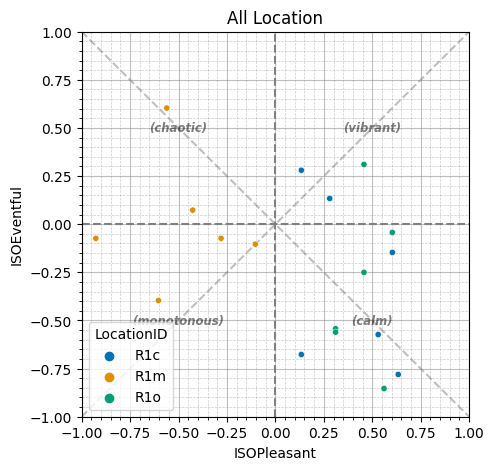

In [7]:
df2.sspy.scatter(hue='LocationID', s=20, title='All Location', diagonal_lines=True)

<h2 style="color:#FFA500 ; font-weight: bold; font-style: italic;">2) Distribution (Density) Plots</h2>

The real power of `Soundscapy` is in creating plots of the distribution of soundscape assessments. The interface for doing this is the same as the scatter plots above.

As we said, this is particularly useful for comparing different soundscapes. So let's see how we can plot three different soundscapes at once.

<Axes: title={'center': 'Comparison of the Soundscapes of Three Locations\n'}, xlabel='ISOPleasant', ylabel='ISOEventful'>

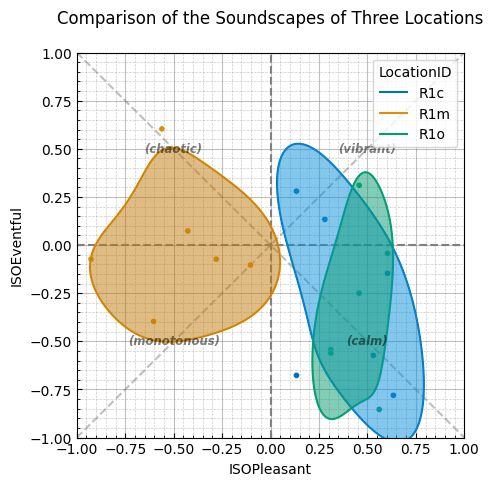

In [8]:
df2.isd.filter_location_ids(["R1c", "R1o", "R1m"]).sspy.density(
    title="Comparison of the Soundscapes of Three Locations\n",
    hue="LocationID",
    density_type="simple",
    incl_scatter=True,
    diagonal_lines=True
    #palette="husl",
)

<h2 style="color:#FFA500 ; font-weight: bold; font-style: italic;">3) Jointplot</h2>

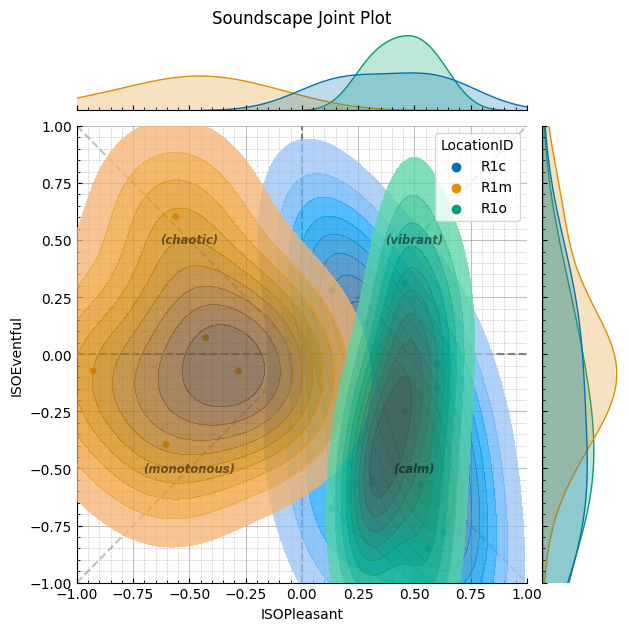

In [9]:
df2.isd.filter_location_ids(["R1c", "R1m", "R1o"]).sspy.jointplot(hue="LocationID", diagonal_lines=True, marginal_kind="kde", density_type="full")

<h3 style="color:white ; font-weight: bold; font-style: italic;">B: Plotting Functions for Visualising Likert Scale Data</h3>


#### Generate a radar/spider plot of PAQ values using paq_radar_plot function


<PolarAxes: >

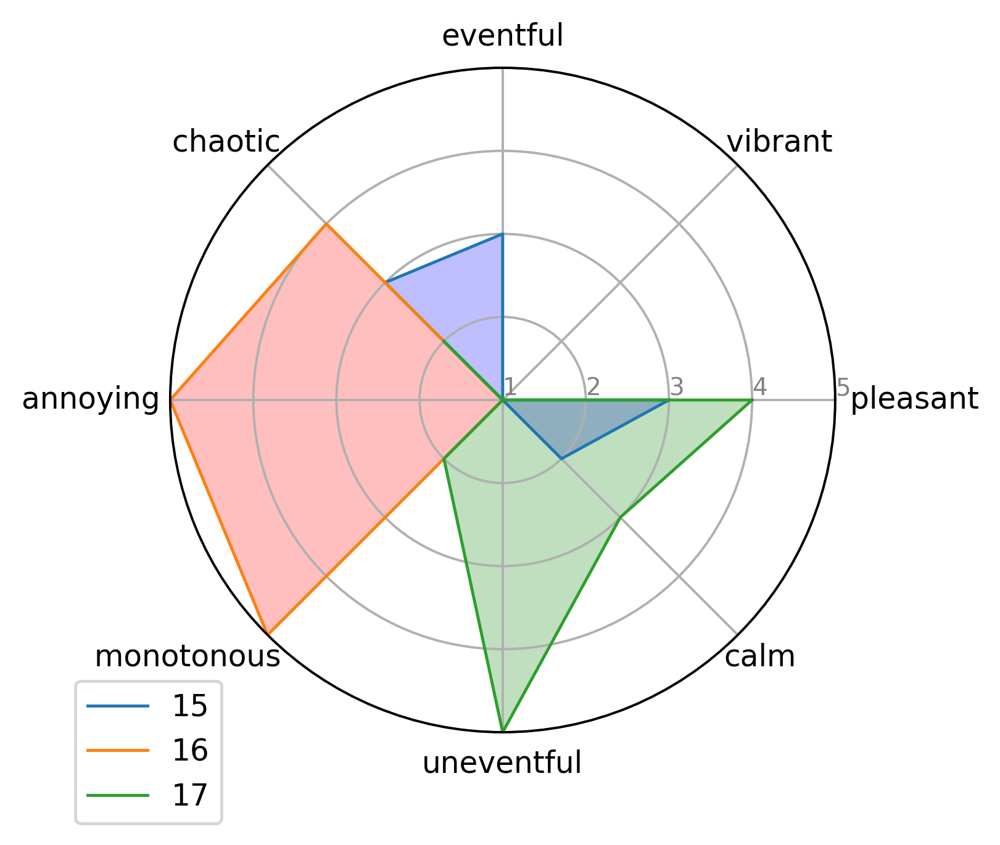

In [16]:
# imports
import pandas as pd
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(4, 4))
plt.rcParams["figure.dpi"] = 350
df1.isd.filter_location_ids(["R1c", "R1m", "R1o"]).tail(3).sspy.paq_radar()

# <h1 style="color:#AED6F1 ; font-weight: bold; font-style: italic;">Summary Statistics of Laboratory Experiment</h1>

In [6]:
df2.describe()

,RecordID,GroupID,SessionID,PAQ1,PAQ2,PAQ3,PAQ4,PAQ5,PAQ6,PAQ7,PAQ8,ISOPleasant,ISOEventful
count,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000,18.000000
mean,9.500000,1.666667,1.666667,3.166667,1.888889,2.333333,2.000000,2.111111,2.833333,2.888889,3.055556,0.117442,-0.203976
std,5.338539,0.766965,0.766965,1.294786,0.900254,1.028992,1.084652,1.640979,1.200490,1.450715,1.551933,0.485799,0.406658
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,-0.926777,-0.853553
25%,5.250000,1.000000,1.000000,2.250000,1.000000,1.250000,1.000000,1.000000,2.000000,1.250000,1.250000,-0.236136,-0.556218
50%,9.500000,1.500000,1.500000,3.500000,2.000000,2.500000,2.000000,1.000000,3.000000,3.000000,4.000000,0.295495,-0.125000
75%,13.750000,2.000000,2.000000,4.000000,3.000000,3.000000,3.000000,4.000000,3.750000,4.000000,4.000000,0.512024,0.044194
max,18.000000,3.000000,3.000000,5.000000,3.000000,4.000000,4.000000,5.000000,5.000000,5.000000,5.000000,0.633883,0.603553


In [7]:
df2.isd.filter_location_ids(["R1m"]).describe()

,RecordID,GroupID,SessionID,PAQ1,PAQ2,PAQ3,PAQ4,PAQ5,PAQ6,PAQ7,PAQ8,ISOPleasant,ISOEventful
count,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000
mean,9.500000,1.666667,1.666667,1.666667,2.000000,2.500000,2.500000,4.333333,3.500000,2.333333,1.166667,-0.483608,0.005055
std,5.612486,0.816497,0.816497,0.816497,0.894427,1.048809,1.378405,0.516398,1.516575,1.032796,0.408248,0.284856,0.331090
min,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,4.000000,1.000000,1.000000,1.000000,-0.926777,-0.396447
25%,5.750000,1.000000,1.000000,1.000000,1.250000,2.000000,1.250000,4.000000,3.000000,1.500000,1.000000,-0.592830,-0.095971
50%,9.500000,1.500000,1.500000,1.500000,2.000000,2.500000,2.500000,4.000000,3.500000,3.000000,1.000000,-0.493718,-0.073223
75%,13.250000,2.000000,2.000000,2.000000,2.750000,3.000000,3.750000,4.750000,4.750000,3.000000,1.000000,-0.316942,0.036612
max,17.000000,3.000000,3.000000,3.000000,3.000000,4.000000,4.000000,5.000000,5.000000,3.000000,2.000000,-0.103553,0.603553


<h2 style="color:orange ; font-weight: bold; font-style: italic;">Plot for the mean coordinate values for each location</h2>


In [18]:
means = df2.isd.mean_responses(group="LocationID")
means = means.sspy.add_paq_coords()
means

,PAQ1,PAQ2,PAQ3,PAQ4,PAQ5,PAQ6,PAQ7,PAQ8,ISOPleasant,ISOEventful
LocationID,,,,,,,,,,
R1c,3.666667,1.666667,2.166667,1.833333,1.000000,2.333333,3.000000,4.000000,0.385977,-0.293761
R1m,1.666667,2.000000,2.500000,2.500000,4.333333,3.500000,2.333333,1.166667,-0.483608,0.005055
R1o,4.166667,2.000000,2.333333,1.666667,1.000000,2.666667,3.333333,4.000000,0.449958,-0.323223


To save the results in Excel Sheet

In [19]:
from pathlib import Path
from datetime import datetime
Excel_Docs_Folder = Path().cwd().joinpath("Excel Docs")
means.to_excel(Excel_Docs_Folder.joinpath("", f"Mean Coordinate Values_{datetime.today().strftime('%Y-%m-%d')}.xlsx"))

#means.to_excel("Mean Coordinate Values.xlsx")

<Axes: title={'center': 'Soundscape Scatter Plot'}, xlabel='ISOPleasant', ylabel='ISOEventful'>

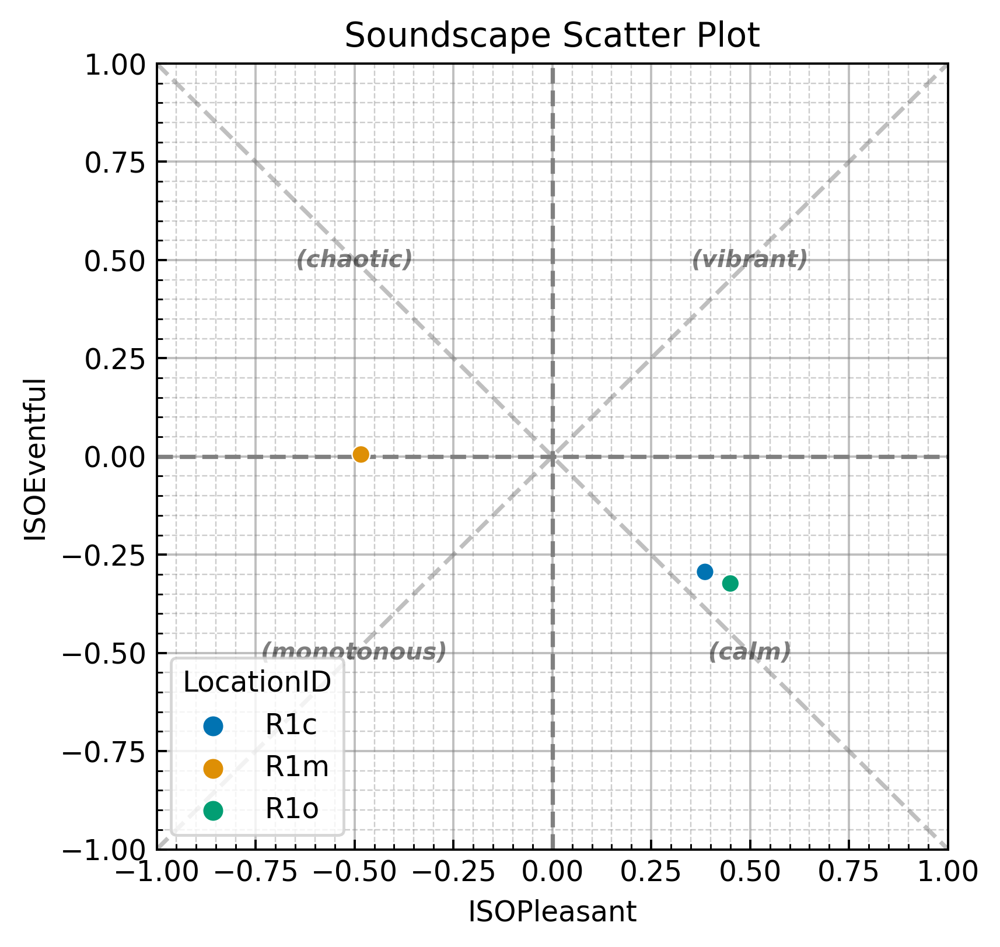

In [20]:
means.sspy.scatter(hue="LocationID", s=40, legend=True, diagonal_lines=True)